# Este é um projeto de análise exploratória mapeando acidentes de veículos em Porto Alegre entre 2019 e 2023 #

Para a criação desta análise, utilizei o conjunto de dados abertos para registro de acidentes de trânsito no município de Porto Alegre extraídos do [site oficial dados abertos POA.](https://dadosabertos.poa.br/dataset/acidentes-de-transito-acidentes)

Neste arquivo com formato CSV, contém informações como:

- Data, localidade, região da cidade e de que forma ocorreu aquele acidente;
- Nome da rua;
- Coordenadas latitudenal e longitudenal;
- Tipo de Veículo;
- Número de vítimas e outros tipos de dados.

Serão utilizados as bibliotecas:
1. Pandas para a visualização do dataframe;
<br>

2. Folium e os plugins HeatMap para gerar um mapa de calor na região dos acidentes juntamente o MarkerCluster, apontando exatamente onde ocorreu cada acidente, agrupando por regiões.
<br>

3. Matplotlib para plotagem dos dados baseado em cada ano.

Execute o código abaixo e acompanhe quais são suas funções através dos comentários.


In [ ]:
import pandas as pd
df = pd.read_csv(r'C:..\projeto de acidentes de dados\cat_acidentes.csv', sep = ';')

In [ ]:
df # mostra o dataframe com os dados do arquivo .csv acima

,data_extracao,predial1,queda_arr,data,feridos,feridos_gr,mortes,morte_post,fatais,auto,...,longitude,latitude,log1,log2,tipo_acid,dia_sem,hora,noite_dia,regiao,consorcio
0,2024-01-01 01:32:36,0.0,0.0,2020-10-17 00:00:00,1,0,0,0,0,3,...,0.000000e+00,0.000000e+00,R MARCOS MOREIRA,R GASTON ENGLERT,ABALROAMENTO,SÁBADO,19:00:00.0000000,NOITE,NORTE,NaN
1,2024-01-01 01:32:36,6699.0,0.0,2019-01-01 00:00:00,1,0,0,0,0,3,...,-8.178406e+08,1.295680e+09,AV ASSIS BRASIL,NaN,ABALROAMENTO,TERÇA-FEIRA,02:45:00.0000000,NOITE,NORTE,NaN
2,2024-01-01 01:32:36,411.0,0.0,2019-01-01 00:00:00,1,0,0,0,0,2,...,-8.267608e+08,1.292030e+09,R DR BARROS CASSAL,NaN,ABALROAMENTO,TERÇA-FEIRA,07:36:00.0000000,DIA,CENTRO,NaN
3,2024-01-01 01:32:36,1500.0,0.0,2019-01-01 00:00:00,4,2,0,0,0,1,...,-8.272275e+08,1.285404e+09,AV FABIO ARAUJO SANTOS,NaN,CHOQUE,TERÇA-FEIRA,16:50:00.0000000,DIA,SUL,NaN
4,2024-01-01 01:32:36,8799.0,0.0,2019-01-01 00:00:00,5,0,0,0,0,3,...,-8.201465e+08,1.288712e+09,AV IPIRANGA,NaN,COLISÃO,TERÇA-FEIRA,19:00:00.0000000,NOITE,LESTE,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64093,2024-01-01 01:32:36,1325.0,0.0,2023-12-17 00:00:00,1,0,0,0,0,1,...,-5.118608e+01,-3.003454e+01,R CARLOS TREIN FILHO,NaN,ABALROAMENTO,DOMINGO,19:15:00.0000000,NOITE,LESTE,NaN
64094,2024-01-01 01:32:36,2300.0,0.0,2023-12-13 00:00:00,1,0,0,0,0,0,...,-5.109239e+01,-3.023724e+01,ESTR OTAVIANO JOSE PINTO,NaN,ABALROAMENTO,QUARTA-FEIRA,19:48:00.0000000,NOITE,SUL,VIVA SUL (LOTE 4)
64095,2024-01-01 01:32:36,1350.0,0.0,2023-12-13 00:00:00,1,0,0,0,0,0,...,-5.113202e+01,-3.008819e+01,ESTR JOAO DE OLIVEIRA REMIAO,NaN,QUEDA,QUARTA-FEIRA,01:30:00.0000000,NOITE,LESTE,NaN
64096,2024-01-01 01:32:36,7466.0,0.0,2023-12-17 00:00:00,1,0,0,0,0,1,...,NaN,NaN,AV PROF OSCAR PEREIRA,NaN,ATROPELAMENTO,DOMINGO,19:34:00.0000000,NOITE,SUL,NaN


In [ ]:
import folium
from folium.plugins import HeatMap # plugin de mapa de calor

mapa = folium.Map(location=[-30.1, -51.15], zoom_start=11) # gera um mapa com zoom com a localidade da cidade de porto alegre

coordenadas = list(zip(df.latitude, df.longitude)) # latitude e longitude de cada acidente.

mapa_calor = HeatMap(coordenadas, radius=9, blur=10) # passa as coordenas para a variável mapa_calor com os pontos mais claros e mais quentes

mapa.add_child(mapa_calor)

mapa

In [ ]:
df = df.dropna(subset=['latitude','longitude'], how='any') # exclui apenas os dados na coluna latitude e longitude com os valores nulos

df # exibe o dataframe sem os valores nulos

,data_extracao,predial1,queda_arr,data,feridos,feridos_gr,mortes,morte_post,fatais,auto,...,longitude,latitude,log1,log2,tipo_acid,dia_sem,hora,noite_dia,regiao,consorcio
0,2024-01-01 01:32:36,0.0,0.0,2020-10-17 00:00:00,1,0,0,0,0,3,...,0.000000e+00,0.000000e+00,R MARCOS MOREIRA,R GASTON ENGLERT,ABALROAMENTO,SÁBADO,19:00:00.0000000,NOITE,NORTE,NaN
1,2024-01-01 01:32:36,6699.0,0.0,2019-01-01 00:00:00,1,0,0,0,0,3,...,-8.178406e+08,1.295680e+09,AV ASSIS BRASIL,NaN,ABALROAMENTO,TERÇA-FEIRA,02:45:00.0000000,NOITE,NORTE,NaN
2,2024-01-01 01:32:36,411.0,0.0,2019-01-01 00:00:00,1,0,0,0,0,2,...,-8.267608e+08,1.292030e+09,R DR BARROS CASSAL,NaN,ABALROAMENTO,TERÇA-FEIRA,07:36:00.0000000,DIA,CENTRO,NaN
3,2024-01-01 01:32:36,1500.0,0.0,2019-01-01 00:00:00,4,2,0,0,0,1,...,-8.272275e+08,1.285404e+09,AV FABIO ARAUJO SANTOS,NaN,CHOQUE,TERÇA-FEIRA,16:50:00.0000000,DIA,SUL,NaN
4,2024-01-01 01:32:36,8799.0,0.0,2019-01-01 00:00:00,5,0,0,0,0,3,...,-8.201465e+08,1.288712e+09,AV IPIRANGA,NaN,COLISÃO,TERÇA-FEIRA,19:00:00.0000000,NOITE,LESTE,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64092,2024-01-01 01:32:36,4069.0,0.0,2023-12-14 00:00:00,1,0,0,0,0,0,...,-5.117559e+01,-3.006223e+01,AV BENTO GONCALVES,NaN,EVENTUAL,QUINTA-FEIRA,00:10:00.0000000,NOITE,LESTE,NaN
64093,2024-01-01 01:32:36,1325.0,0.0,2023-12-17 00:00:00,1,0,0,0,0,1,...,-5.118608e+01,-3.003454e+01,R CARLOS TREIN FILHO,NaN,ABALROAMENTO,DOMINGO,19:15:00.0000000,NOITE,LESTE,NaN
64094,2024-01-01 01:32:36,2300.0,0.0,2023-12-13 00:00:00,1,0,0,0,0,0,...,-5.109239e+01,-3.023724e+01,ESTR OTAVIANO JOSE PINTO,NaN,ABALROAMENTO,QUARTA-FEIRA,19:48:00.0000000,NOITE,SUL,VIVA SUL (LOTE 4)
64095,2024-01-01 01:32:36,1350.0,0.0,2023-12-13 00:00:00,1,0,0,0,0,0,...,-5.113202e+01,-3.008819e+01,ESTR JOAO DE OLIVEIRA REMIAO,NaN,QUEDA,QUARTA-FEIRA,01:30:00.0000000,NOITE,LESTE,NaN


In [ ]:
from folium.plugins import MarkerCluster

mapa = folium.Map(location=[-30.1, -51.15], zoom_start=11)
mapa_cluster = MarkerCluster (coordenadas)
mapa.add_child(mapa_cluster)
# agrupa regiões de acidentes pelas coordenadas e demarca exatamente onde foi cada um.


mapa

In [ ]:
df['data'] = pd.to_datetime(df['data']) # extrai a data e o ano para cada linha
df_ano = df['data'].dt.year.value_counts()
df_ano

data
2023    14337
2022    13325
2019    12444
2021    11699
2020     2894
2202        1
Name: count, dtype: int64

In [ ]:
df_ano = df_ano.drop(2202) ## retira a linha com o ano incorreto de 2202 que retornou na última linha na tabela acima

df_ano

data
2023    14337
2022    13325
2019    12444
2021    11699
2020     2894
Name: count, dtype: int64

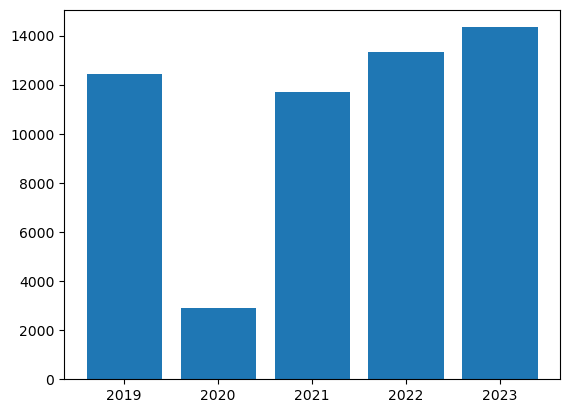

In [ ]:
import matplotlib.pyplot as plt

plt.bar(df_ano.index, df_ano.values) # cria um gráfico de barras com índices do eixo x = ano e valores no eixo y
plt.show()

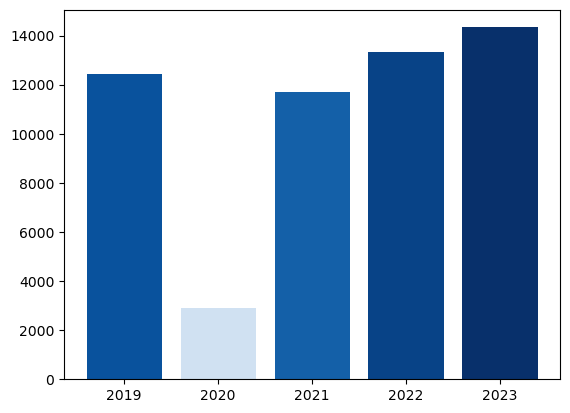

In [ ]:
gradiente = df_ano/df_ano.max()
cores =plt.cm.Blues(gradiente)

plt.bar(df_ano.index, df_ano.values, color = cores) # define variação de cores a partir dos valores.

plt.show()

Tivemos números baixos em 2020 pois após alertas da COVID-19, a população saiu menos de casa, tendo assim, menos acidentes por conta do lockdown.
<br><br>

1. __Ano__: 2019
> - __Total de acidentes__: 12.444
> - __Média de acidentes por mês__: aproximadamente 1.037 acidentes.

2. __Ano__: 2020
> - __Total de acidentes__: 2.894
> - __Média de acidentes por mês__:  aproximadamente 241 acidentes.

3. __Ano__: 2021
> - __Total de acidentes__: 11.699
> - __Média de acidentes por mês__:  aproximadamente 975 acidentes.

4. __Ano__: 2022
> - __Total de acidentes__: 13.325
> - __Média de acidentes por mês__: aproximadamente 1.111 acidentes.

5. __Ano__: 2023
> - __Total de acidentes__: 14.337
> - __Média de acidentes por mês__: aproximadamente 1.195 acidentes.

<br>

- Segundo uma matéria publicada pela Prefeitura de Porto Alegre (2021), 100% população da cidade foi vacinada com pelo menos a primeira dose. Ao se vacinarem, os habitantes voltaram novamente a sair de suas casas e retomar aos trabalhos presenciais, fazendo com que os números de acidentes voltassem a subir a partir do ano de 2021.

Fonte: __COVID-19:__ Porto Alegre ultrapassa 100% da população estimada vacinada com a primeira dose. Prefeitura de Porto Alegre, Porto Alegre, 3 de dezembro de 2021. Disponível em: [<https://prefeitura.poa.br/sms/noticias/covid-19-porto-alegre-ultrapassa-100-da-populacao-estimada-vacinada-com-primeira-dose>]. Acesso em: 08 de janeiro de 2024.
